In [ ]:
# load styleGan code
import os
!pip install gdown --upgrade

if os.path.isdir("/content/drive/MyDrive/colab-sg2-ada-pytorch"):
    %cd "/content/drive/MyDrive/colab-sg2-ada-pytorch/stylegan2-ada-pytorch"
elif os.path.isdir("/content/drive/"):
    #install script
    %cd "/content/drive/MyDrive/"
    !mkdir colab-sg2-ada-pytorch
    %cd colab-sg2-ada-pytorch
    !git clone https://github.com/NVlabs/stylegan2-ada-pytorch
    %cd stylegan2-ada-pytorch
    !mkdir downloads
    !mkdir datasets
    !mkdir pretrained
    !gdown --id 1-5xZkD8ajXw1DdopTkH_rAoCsD72LhKU -O /content/drive/MyDrive/colab-sg2-ada-pytorch/stylegan2-ada-pytorch/pretrained/wikiart.pkl
else:
    !git clone https://github.com/NVlabs/stylegan2-ada-pytorch
    %cd stylegan2-ada-pytorch
    !mkdir downloads
    !mkdir datasets
    !mkdir pretrained
    %cd pretrained
    !gdown --id 1-5xZkD8ajXw1DdopTkH_rAoCsD72LhKU
    %cd ../

!pip uninstall ninja --y
!pip install ninja opensimplex torch==1.7.1 torchvision==0.8.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Cloning into 'stylegan2-ada-pytorch'...
remote: Enumerating objects: 128, done.
remote: Total 128 (delta 0), reused 0 (delta 0), pack-reused 128
Receiving objects: 100% (128/128), 1.12 MiB | 2.60 MiB/s, done.
Resolving deltas: 100% (57/57), done.
/content/stylegan2-ada-pytorch
/content/stylegan2-ada-pytorch/pretrained
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1-5xZkD8ajXw1DdopTkH_rAoCsD72LhKU
To: /content/stylegan2-ada-pytorch/pretrained/wikiart.pkl
100% 382M/382M [00:03<00:00, 103MB/s]
/content/stylegan2-ada-pytorch
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 108 k

In [ ]:
PATH = '/content/drive/My Drive/'
RES_PATH = PATH + 'colab-sg2-ada-pytorch/stylegan2-ada-pytorch/'
MODEL_PATH = 'pretrained/wikiart.pkl'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!cd {RES_PATH}

In [ ]:
%matplotlib inline
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import random
import torchvision.utils as vutils
import pickle
import torch.utils as torch_utils
from PIL import Image
import torchvision.models as models
import copy
from __future__ import print_function
import PIL.Image
import dnnlib
import legacy
from typing import List
import click
from torch_utils import misc
from torch_utils.ops import bias_act, upfirdn2d
from training.networks import modulated_conv2d
import pandas as pd
# try to use the gpu if possible
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

### General Methods

In [ ]:
def im_convert(tensor):
    """ Display a tensor as an image. """
    
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485,
                                                                0.456, 0.406))
    image = image.clip(0, 1)

    return image


def load_styleGan(model, local=False):
  if local:
    with open(model, 'rb') as f:
      G = pickle.load(f)['G_ema'].to(device)
  else:   
    url = f'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/{model}.pkl'
    with dnnlib.util.open_url(url) as f:
            G = legacy.load_network_pkl(f)['G_ema'].to(device) # type: ignore  

  G = copy.deepcopy(G).eval().requires_grad_(False).to(device) # type: ignore

  return G 

def load_vgg():
  # get the "features" portion of VGG19
  vgg = models.vgg19(pretrained=True).features

  # freeze all VGG parameters since we're only optimizing the target image
  for param in vgg.parameters():
      param.requires_grad_(False)
      
  vgg.to(device)

  return vgg

def create_synth_img_and_w(G, seed):
  z = torch.from_numpy(np.random.RandomState(seed).randn(1, G.z_dim)).to(device)
  c = None
  w = G.mapping(z, c, truncation_psi=0.5, truncation_cutoff=8)
  img = G.synthesis(w, noise_mode='const', force_fp32=True)
  img = reshape_synth_image(img)

  return img, w

def reshape_synth_image(image, max_size=400, shape=None):
  # Downsample image to be same as content input and style input
  if image.shape[2] > 400:
        image = F.interpolate(image, size=(400, 400), mode='area')
  return image     
  
def display_selected_images(content_img, style_img, content_title, style_title):
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 10))
  ax1.title.set_text(content_title)
  ax2.title.set_text(style_title)
  ax1.imshow(im_convert(content_img))
  ax2.imshow(im_convert(style_img))

# this function get maximum 7 different data to print
def plot(mat, nameLines, title, xlabelName, ylabelName):
    plt.figure(figsize=(10, 8))
    plt.title(title, fontsize=16)
    plt.xlabel(xlabelName, fontsize=13)
    plt.ylabel(ylabelName, fontsize=13)

    colorsLine = ['b-', 'g-', 'r-', 'y-', 'c-', 'k-', 'm-']
    for i in range(len(nameLines)):
        plt.plot(nameLines[i], colorsLine[i], data=mat, label=nameLines[i])

    plt.legend()  # show legend
    plt.show()  # show graph

def createMatToPrint(LossList, axisName, iters):
    arr = np.array(LossList).T
    mat = pd.DataFrame(arr)
    mat = mat.set_axis(axisName, axis=1)
    mat = mat.set_index([pd.Index(list(range(1, iters + 1)))])
    return mat

def plotLoss(LossList, iters, title):
    legendName = ["Train Loss"]
    arrToPlot = createMatToPrint(LossList, legendName, iters)
    plot(arrToPlot, legendName, title, 'iterations', 'loss')


# Load the images and models to test on

In [ ]:
G = load_styleGan(MODEL_PATH, local=True)
CONTENT1_SEED = 2511
STYLE1_SEED = 274
CONTENT2_SEED = 902
STYLE2_SEED = 1902

content_img1, content_w1 = create_synth_img_and_w(G, seed=CONTENT1_SEED)
style_img1, style_w1 = create_synth_img_and_w(G, seed=STYLE1_SEED)

content_img2, content_w2 = create_synth_img_and_w(G, seed=CONTENT2_SEED)
style_img2, style_w2 = create_synth_img_and_w(G, seed=STYLE2_SEED)

# display the images
display_selected_images(content_img1, style_img1, 'content image 1',
                        'style image 1' )
display_selected_images(content_img2, style_img2, 'content image 2',
                        'style image 2')

# Style Mixing

---



In [ ]:
def generate_style_mix(G, col_styles,
                       content_w, style_w,
                       truncation_psi=1, noise_mode='const'):
  
  print('Generating style-mixed images...')
  w = content_w[0].clone()

  for col in col_styles:
    w[col] = style_w[0][col]

  image = G.synthesis(w[np.newaxis], noise_mode=noise_mode)

  return image

def try_differnt_layers_for_style_mixing(G, content, content_w, style_w):
  col_styles_list = [range(0, 4), range(4, 7), range(7, 11),
                     range(11, 15), range(15, 18)]
  

  for col_styles in col_styles_list:
    # style mixing
    target = generate_style_mix(G, col_styles, content_w, style_w)
  # show the results
    display_selected_images(content, target,
                            'content image', f'w layers: {col_styles}')

Generating style-mixed images...
Generating style-mixed images...
Generating style-mixed images...
Generating style-mixed images...
Generating style-mixed images...


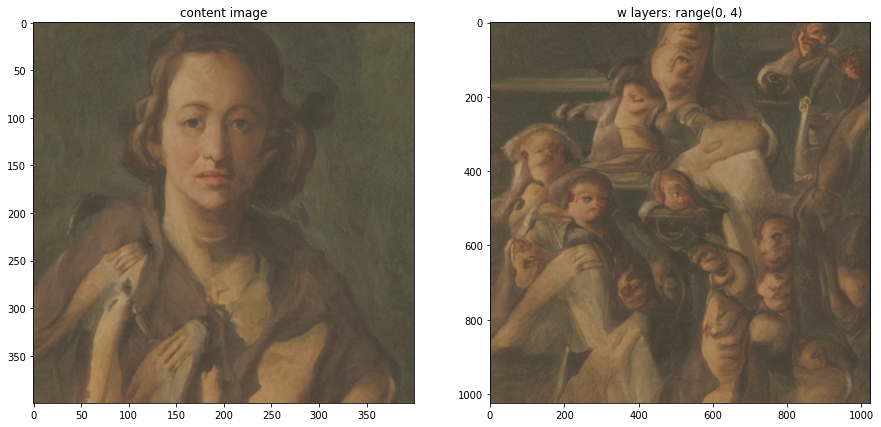

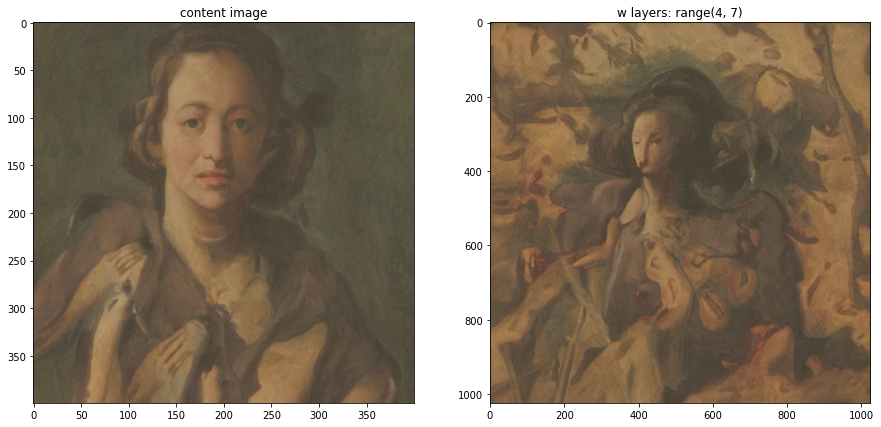

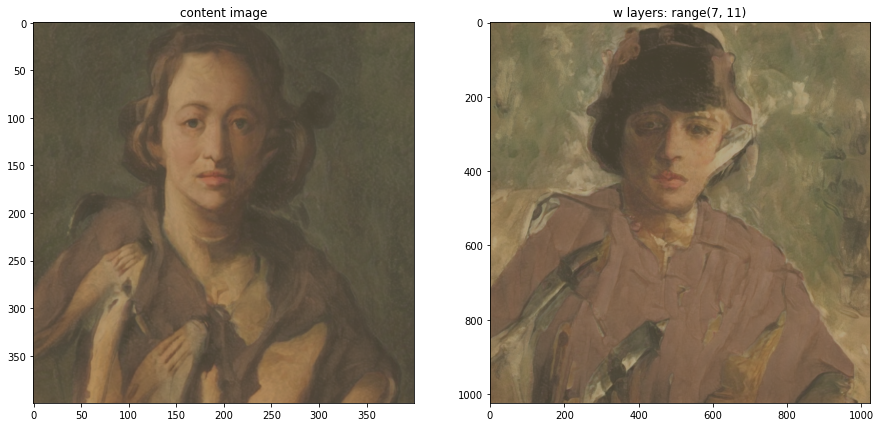

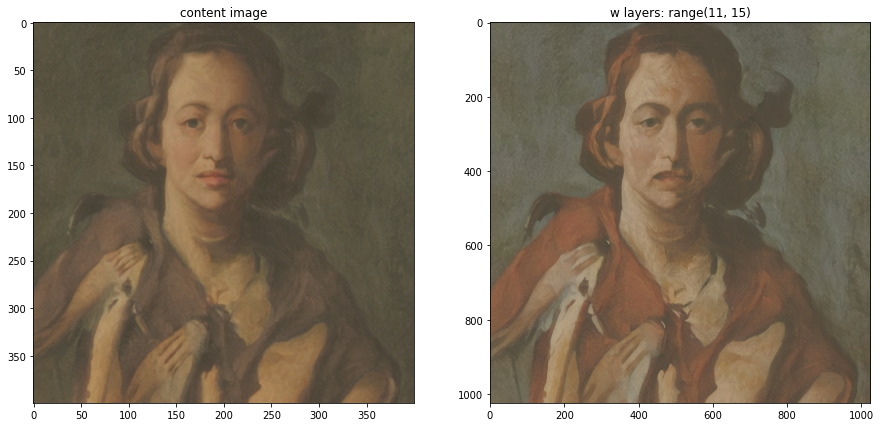

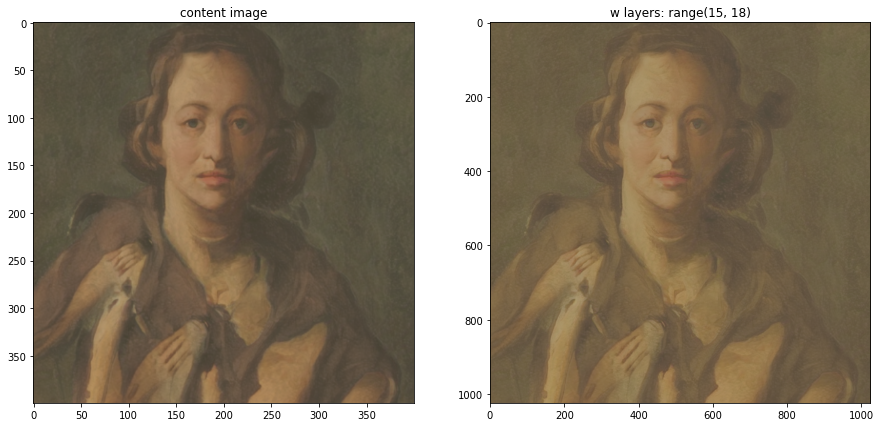

In [ ]:
try_differnt_layers_for_style_mixing(G, content_img1, content_w1, style_w1)

Generating style-mixed images...
Generating style-mixed images...
Generating style-mixed images...
Generating style-mixed images...
Generating style-mixed images...


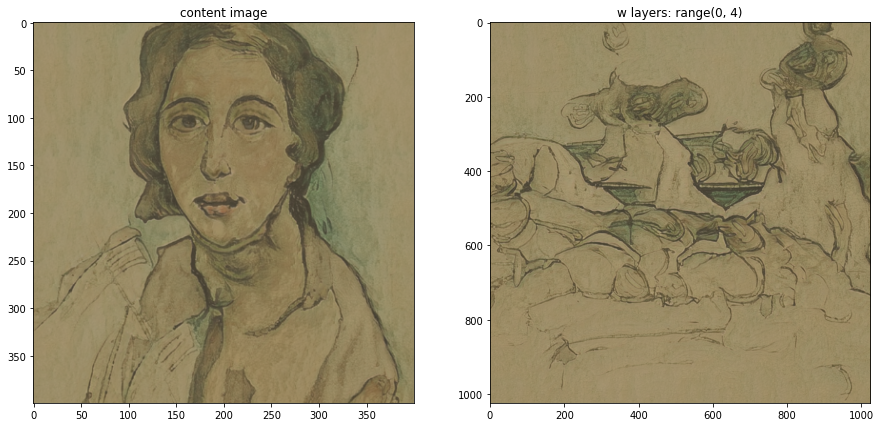

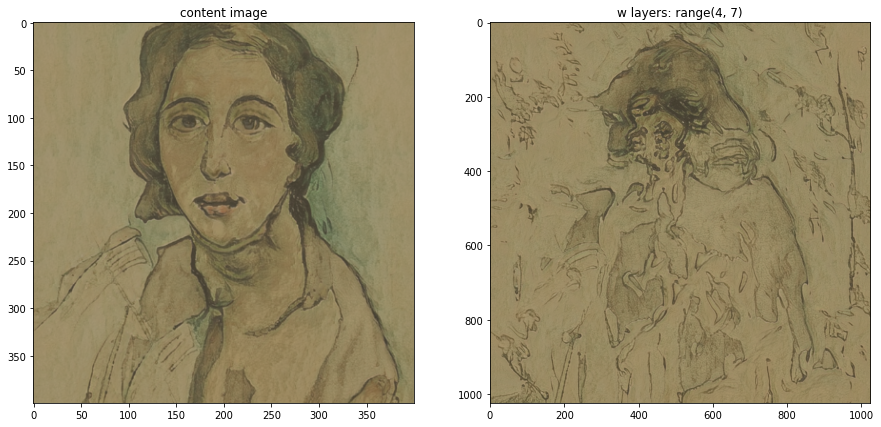

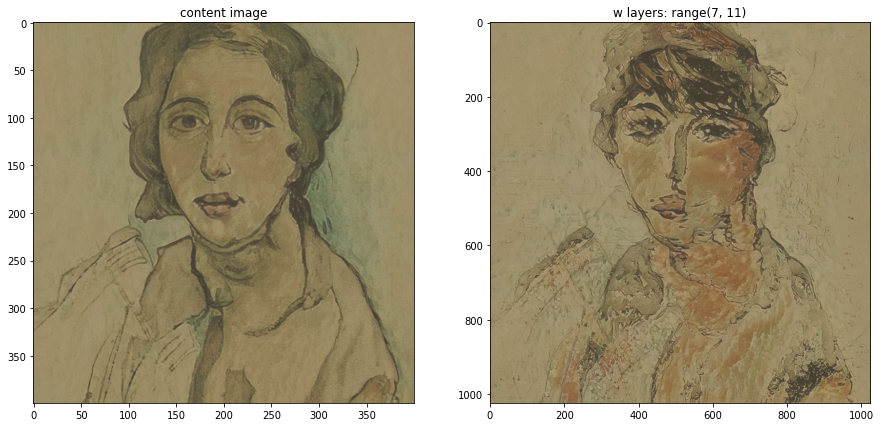

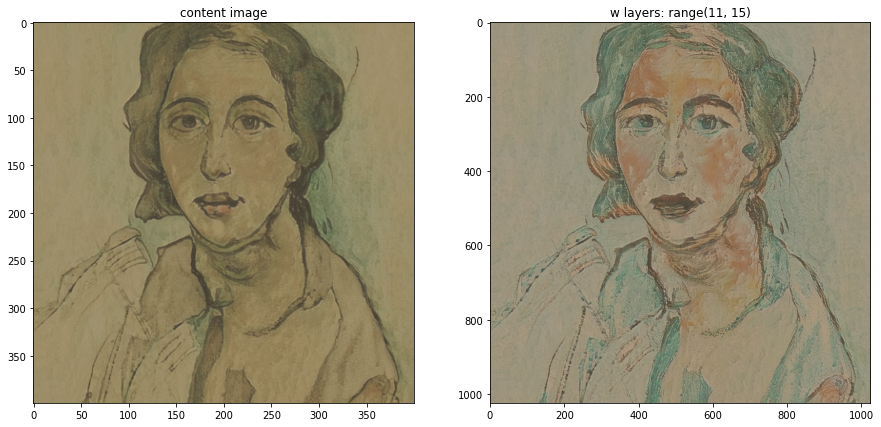

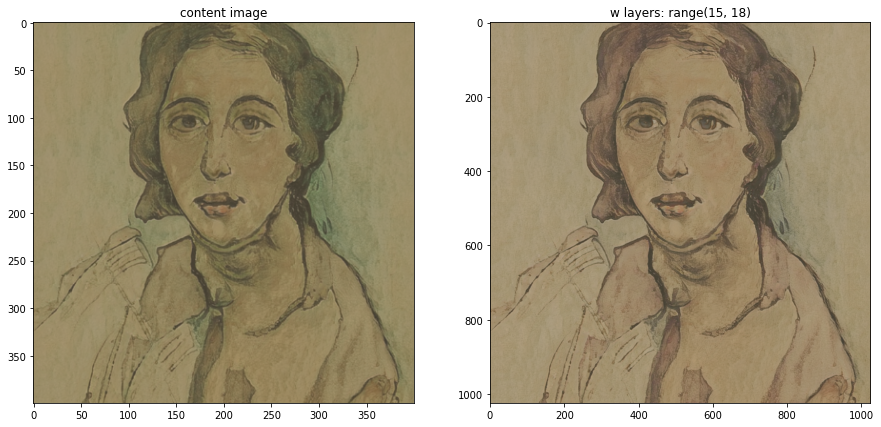

In [ ]:
try_differnt_layers_for_style_mixing(G, content_img2, content_w2, style_w2)

# Optimization In W+ 

---



### Style Transfer Methods

In [ ]:
def gram_matrix(tensor):
    """ Calculate the Gram Matrix of a given tensor 
    """
    gram = None
    b, d, h, w = tensor.size()
    tensor = tensor.view(d, h*w)
    gram = torch.mm(tensor, tensor.t())
    return gram

def get_features(image, model, layers=None):
    """ Run an image forward through a model and get the features for 
        a set of layers. Default layers are for VGGNet matching Gatys et al
    """

    if layers is None:
        layers = {'0': 'conv1_1',
                 '5':  'conv2_1',
                 '10': 'conv3_1',
                 '19': 'conv4_1',
                 '21': 'conv4_2',
                 '28': 'conv5_1'}
        
    features = {}
    x = image
    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features

### W+ Optimizions methods

In [ ]:
def create_w(content_w):
  w_plus = torch.tensor(content_w.clone(), dtype=torch.float32,
                        device=device, requires_grad=True)
  w_plus.requires_grad = True #the only learnable parameter

  return w_plus


def optimize_ws(G, vgg, w_opt, content_features, style_grams,
                loss_weights, style_weights, lr, content_img, steps): 
  optimizer = torch.optim.Adam([w_opt], betas=(0.9, 0.999), lr=lr)

  content_weight = loss_weights[0]
  style_weight = loss_weights[1]

  # for displaying the target image, intermittently
  show_every = 20 

  trainLoss = []
  print("start optimized")

  for ii in range(1, steps+1):
      # Synth images from opt_w.
      synth_img = G.synthesis(w_opt, noise_mode='const')
      target = reshape_synth_image(synth_img)
          
      ## Then calculate the content loss
      target_features = get_features(target, vgg)
      content_loss = torch.mean((target_features["conv4_2"] - content_features["conv4_2"]) ** 2)
      
      # the style loss
      # initialize the style loss to 0
      style_loss = 0

      # iterate through each style layer and add to the style loss
      for layer in style_weights:
          # get the "target" style representation for the layer
          target_feature = target_features[layer]
          _, d, h, w = target_feature.shape
          target_gram = gram_matrix(target_feature)
          style_gram = style_grams[layer]
          layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram) ** 2)
          
          # add to the style loss
          style_loss += layer_style_loss / (d * h * w)
          
      total_loss = content_weight * content_loss + style_weight * style_loss
      trainLoss.append(total_loss.item())

      # update your target image
      optimizer.zero_grad()
      total_loss.backward()
      optimizer.step()

      # display intermediate images and print the loss
      if ii % show_every == 0 and ii <= 100:
          print('Total loss: ', total_loss.item())
          print('Content loss: ', content_weight * content_loss)
          print('Sytle loss: ', style_weight * style_loss)
          plt.imshow(im_convert(target))
          plt.show()
          
  # display content and final, target image
  display_selected_images(content_img, target, 'content image', 'target image')

  return w_opt, trainLoss

Load the paramaters for the style transfer process

In [ ]:
def run_optimizion_on_wplus(content_img, style_img, content_w):
  #### load models and create W+
  G = load_styleGan(MODEL_PATH, local=True)
  vgg = load_vgg()

  # get content and style features
  content_features = get_features(content_img, vgg)
  style_features = get_features(style_img, vgg)

  # calculate the gram matrices for each layer of our style representation
  style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

  # optimize W+
  w_plus = create_w(content_w)
  lr = 0.01
  loss_weights = [0.4, 0.6]
  steps = 500 # iteration hyperparameters
  style_weights = {"conv1_1": 1., "conv2_1": 0.3, "conv3_1": 0.7,
                   "conv4_1": 0.3, "conv5_1": 0.1}
  ws, trainLoss = optimize_ws(G, vgg, w_plus, content_features, style_grams,
                  loss_weights, style_weights, lr, content_img, steps)
  plotLoss([trainLoss], steps, "Optimization over W+ Train Loss")

### Optimize W+

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  


start optimized
Total loss:  2.654789447784424
Content loss:  tensor(1.4548, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(1.2000, device='cuda:0', grad_fn=<MulBackward0>)


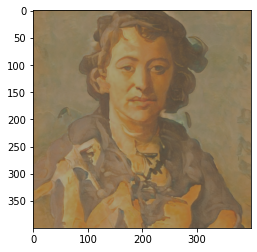

Total loss:  2.246051549911499
Content loss:  tensor(1.4268, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(0.8192, device='cuda:0', grad_fn=<MulBackward0>)


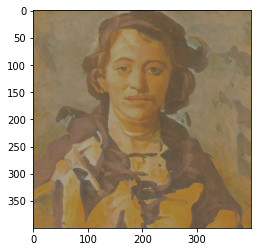

Total loss:  2.015068292617798
Content loss:  tensor(1.3154, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(0.6997, device='cuda:0', grad_fn=<MulBackward0>)


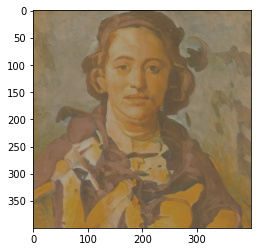

Total loss:  1.8940613269805908
Content loss:  tensor(1.2568, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(0.6373, device='cuda:0', grad_fn=<MulBackward0>)


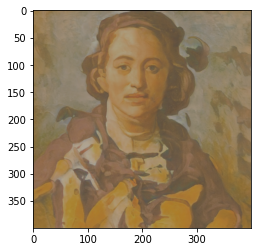

Total loss:  1.820876121520996
Content loss:  tensor(1.2296, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(0.5913, device='cuda:0', grad_fn=<MulBackward0>)


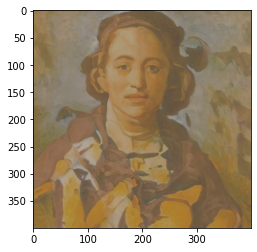

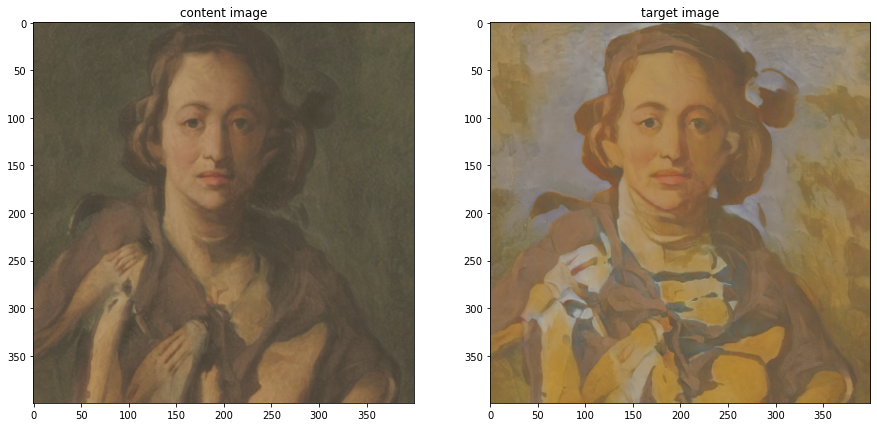

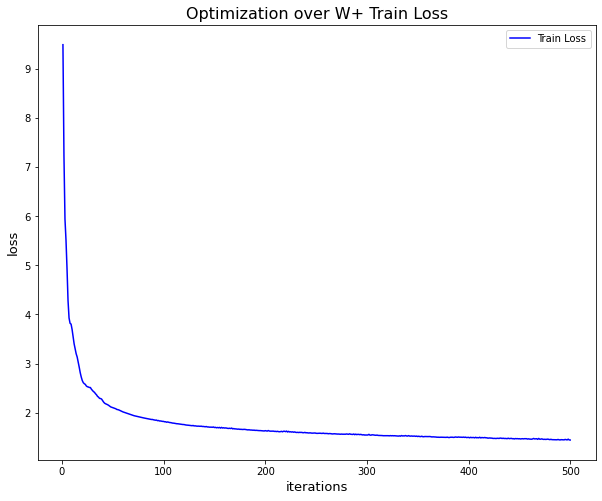

In [ ]:
run_optimizion_on_wplus(content_img1, style_img1, content_w1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  


start optimized
Total loss:  7.691864013671875
Content loss:  tensor(1.7253, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(5.9666, device='cuda:0', grad_fn=<MulBackward0>)


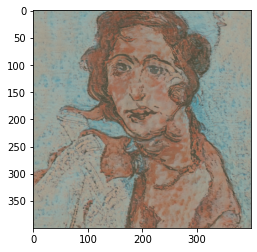

Total loss:  4.296213150024414
Content loss:  tensor(1.7222, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(2.5741, device='cuda:0', grad_fn=<MulBackward0>)


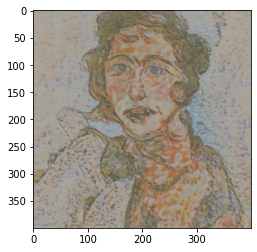

Total loss:  3.588742256164551
Content loss:  tensor(1.6884, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(1.9004, device='cuda:0', grad_fn=<MulBackward0>)


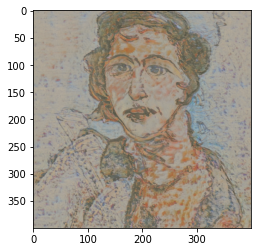

Total loss:  3.1335980892181396
Content loss:  tensor(1.6557, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(1.4779, device='cuda:0', grad_fn=<MulBackward0>)


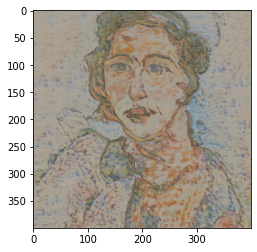

Total loss:  2.864745855331421
Content loss:  tensor(1.6394, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(1.2253, device='cuda:0', grad_fn=<MulBackward0>)


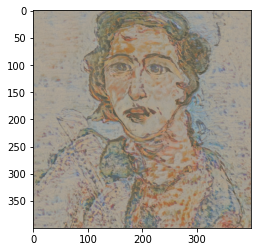

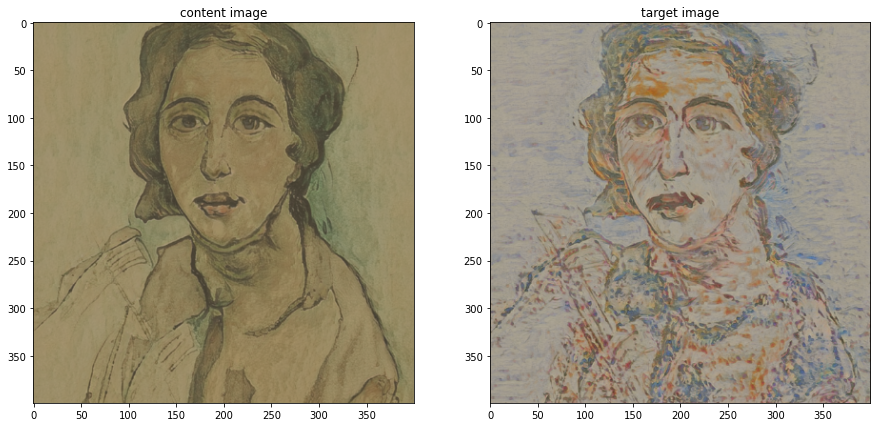

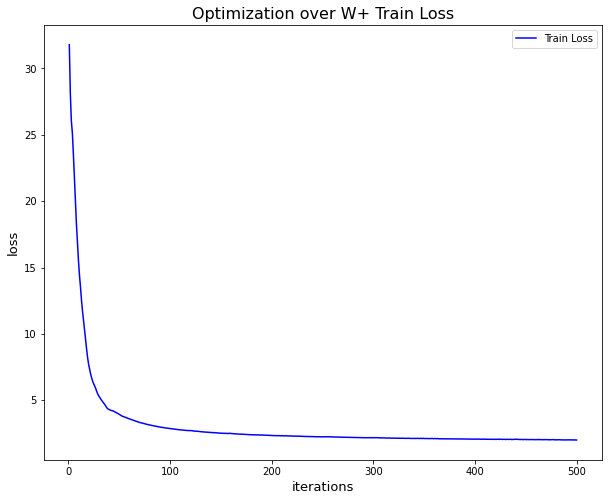

In [ ]:
run_optimizion_on_wplus(content_img2, style_img2, content_w2)

# Optimization In S 

---



## New forwards methods for the network, remove the affine functions

In [ ]:
def forward_synthesis_network(self, ws, styles, **block_kwargs):
    block_ws = []
    with torch.autograd.profiler.record_function('split_ws'):
        misc.assert_shape(ws, [None, self.num_ws, self.w_dim])
        ws = ws.to(torch.float32)
        w_idx = 0
        for res in self.block_resolutions:
            block = getattr(self, f'b{res}')
            block_ws.append(ws.narrow(1, w_idx,
                                      block.num_conv + block.num_torgb))
            w_idx += block.num_conv

    x = img = None
    i = 0
    for res, cur_ws in zip(self.block_resolutions, block_ws):
        block = getattr(self, f'b{res}')
        x, img = block(block, x, img, cur_ws, style=styles[i], **block_kwargs)
        i += 1
    return img


def forward_synthesis_block(self, x, img, ws, style, force_fp32=False,
                            fused_modconv=None, **layer_kwargs):
    misc.assert_shape(ws, [None, self.num_conv + self.num_torgb, self.w_dim])
    w_iter = iter(ws.unbind(dim=1))
    dtype = torch.float16 if self.use_fp16 and not force_fp32 else torch.float32
    memory_format = torch.channels_last if self.channels_last and not force_fp32 else torch.contiguous_format
    if fused_modconv is None:
        with misc.suppress_tracer_warnings(): # this value will be treated as a constant
            fused_modconv = (not self.training) and (dtype == torch.float32 or int(x.shape[0]) == 1)

    # Input.
    if self.in_channels == 0:
        x = self.const.to(dtype=dtype, memory_format=memory_format)
        x = x.unsqueeze(0).repeat([ws.shape[0], 1, 1, 1])
    else:
        misc.assert_shape(x, [None, self.in_channels,
                              self.resolution // 2, self.resolution // 2])
        x = x.to(dtype=dtype, memory_format=memory_format)

    # Main layers.
    if self.in_channels == 0:
        x = self.conv1(self.conv1, x, next(w_iter), fused_modconv=fused_modconv,
                       style=style['s1'], **layer_kwargs)
    elif self.architecture == 'resnet':
        y = self.skip(x, gain=np.sqrt(0.5))
        x = self.conv0(self.conv0, x, w=next(w_iter), fused_modconv=fused_modconv,
                       style=style['s0'], **layer_kwargs)
        x = self.conv1(self.conv1, x, w=next(w_iter), fused_modconv=fused_modconv,
                       gain=np.sqrt(0.5), style=style['s1'], **layer_kwargs)
        x = y.add_(x)
    else:
        x = self.conv0(self.conv0, x, w=next(w_iter), fused_modconv=fused_modconv,
                       style=style['s0'], **layer_kwargs)
        x = self.conv1(self.conv1, x, w=next(w_iter), fused_modconv=fused_modconv,
                       style=style['s1'], **layer_kwargs)

    # ToRGB.
    if img is not None:
        misc.assert_shape(img, [None, self.img_channels,
                                self.resolution // 2, self.resolution // 2])
        img = upfirdn2d.upsample2d(img, self.resample_filter)
    if self.is_last or self.architecture == 'skip':
        y = self.torgb(self.torgb, x, w=next(w_iter),
                       fused_modconv=fused_modconv, style=style['s2'])
        y = y.to(dtype=torch.float32, memory_format=torch.contiguous_format)
        img = img.add_(y) if img is not None else y

    assert x.dtype == dtype
    assert img is None or img.dtype == torch.float32
    return x, img 


def forward_conv_layer(self, x, w, noise_mode='random',
              fused_modconv=True, gain=1, style=None): 
     
    assert noise_mode in ['random', 'const', 'none']
    in_resolution = self.resolution // self.up
    misc.assert_shape(x, [None, self.weight.shape[1],
                          in_resolution, in_resolution])

    noise = None
    if self.use_noise and noise_mode == 'random':
        noise = torch.randn([x.shape[0], 1, self.resolution, self.resolution],
                            device=x.device) * self.noise_strength
    if self.use_noise and noise_mode == 'const':
        noise = self.noise_const * self.noise_strength

    flip_weight = (self.up == 1) # slightly faster
    x = modulated_conv2d(x=x, weight=self.weight, styles=style,
                         noise=noise, up=self.up,
        padding=self.padding, resample_filter=self.resample_filter,
         flip_weight=flip_weight, fused_modconv=fused_modconv)

    act_gain = self.act_gain * gain
    act_clamp = self.conv_clamp * gain if self.conv_clamp is not None else None
    x = bias_act.bias_act(x, self.bias.to(x.dtype), act=self.activation,
                          gain=act_gain, clamp=act_clamp)
    return x


def forward_torgb_layer(self, x, w, fused_modconv=True, style=None):
    styles = style * self.weight_gain
    x = modulated_conv2d(x=x, weight=self.weight, styles=styles,
                         demodulate=False, fused_modconv=fused_modconv)
    x = bias_act.bias_act(x, self.bias.to(x.dtype), clamp=self.conv_clamp)
    return x     

In [ ]:
def create_initial_s_and_new_network_design(G, block_sizes, content_seed):
  new_G = copy.deepcopy(G).eval().requires_grad_(False).to(device)

  ###########
  # replace the forward of the layers to be without the creation of s
  # s is going to be an input to the network instaed of creating it from w
  ##########
  setattr(new_G.synthesis, 'forward', forward_synthesis_network)
  
  # create w to use at the affine functions of G, to create s
  z = torch.from_numpy(np.random.RandomState(content_seed).randn(1, G.z_dim)).to(device)
  c = None
  ws = new_G.mapping(z, c, truncation_psi=0.5, truncation_cutoff=8)
  w = ws[0][:1]

  # change the network and create the initial s
  s_tensor = []

  for size in block_sizes:

    block = getattr(new_G.synthesis, f'b{size}')
    block.forward = forward_synthesis_block

    if size != 4:
      setattr(block.conv0, 'forward', forward_conv_layer)
      s0 = block.conv0.affine(w)
      s_tensor.append(s0)

    setattr(block.conv1, 'forward', forward_conv_layer)
    s1 = block.conv1.affine(w)
    setattr(block.torgb, 'forward', forward_torgb_layer)
    s2 = block.torgb.affine(w)

    setattr(new_G.synthesis, f'b{size}', block)
    s_tensor.append(s1)
    s_tensor.append(s2)

  listChunkSize = [s.shape[1] for s in s_tensor]
  s_tensor = torch.autograd.Variable(torch.cat(s_tensor, dim=1),
                                     requires_grad=True)
  
  return new_G, s_tensor, listChunkSize

In [ ]:
def tensor_to_dict(tensor, block_sizes, listChunkSize):
  s_ls = torch.split(tensor, listChunkSize, 1) # convert back to list
  i = 0
  s_dict = []

  for size in block_sizes:
    block_dict = {"s0": None, "s1": None, "s2": None}
    if size != 4:
      for j in range(3):
        block_dict[f's{j}'] = s_ls[i + j]
      i += 3     
    else:
      block_dict[f's0'] = None
      for j in range(1, 3):
        block_dict[f's{j}'] = s_ls[i + j-1] 
      i += 2     

    s_dict.append(block_dict)

  return s_dict  


def optimize_s(G, vgg, s_opt, ws, content_features, style_grams,
                loss_weights, style_weights, lr,
                content_img, block_sizes, listChunkSize, steps): 
  optimizer = torch.optim.Adam([s_opt], betas=(0.9, 0.999), lr=lr)

  content_weight = loss_weights[0]
  style_weight = loss_weights[1]

  # for displaying the target image, intermittently
  show_every = 20

  trainLoss = [] 
  print("start optimized")

  for ii in range(1, steps+1):
      s_dict = tensor_to_dict(s_opt, block_sizes, listChunkSize)
      synth_img = G.synthesis(G.synthesis, ws, styles=s_dict,
                              noise_mode='const', force_fp32=True)
      target = reshape_synth_image(synth_img)
          
      ## Then calculate the content loss
      target_features = get_features(target, vgg)

      content_loss = torch.mean((target_features["conv4_2"] - content_features["conv4_2"]) ** 2)
      
      # the style loss
      # initialize the style loss to 0
      style_loss = 0

      # iterate through each style layer and add to the style loss
      for layer in style_weights:
          # get the "target" style representation for the layer
          target_feature = target_features[layer]
          _, d, h, w = target_feature.shape
          target_gram = gram_matrix(target_feature)
          style_gram = style_grams[layer]
          layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram) ** 2)
          
          # add to the style loss
          style_loss += layer_style_loss / (d * h * w)
          
      total_loss = content_weight * content_loss + style_weight * style_loss
      trainLoss.append(total_loss.item())

      # update your target image
      optimizer.zero_grad()
      total_loss.backward()
      optimizer.step()

      # display intermediate images and print the loss
      if ii % show_every == 0 and ii <= 100:
          print('Total loss: ', total_loss.item())
          print('Content loss: ', content_weight * content_loss)
          print('Sytle loss: ', style_weight * style_loss)
          plt.imshow(im_convert(target))
          plt.show()
          
  # display content and final, target image
  display_selected_images(content_img, target, 'content image', 'target image')

  return s_opt, trainLoss

In [ ]:
def run_optimizion_on_s(content_img, style_img, content_w, content_seed):
  G = load_styleGan(MODEL_PATH, local=True)
  vgg = load_vgg()

  # get content and style features
  content_features = get_features(content_img, vgg)
  style_features = get_features(style_img, vgg)

  # calculate the gram matrices for each layer of our style representation
  style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

  # get initial s and the modified netowrk
  block_sizes = [4, 8, 16, 32, 64, 128, 256, 512, 1024]
  new_G, s_tensor, listChunkSize = create_initial_s_and_new_network_design(
      G, block_sizes, content_seed)

  # optimize s
  lr = 0.01
  loss_weights = [0.4, 10]
  style_weights = {"conv1_1": 1., "conv2_1": 0.3, "conv3_1": 0.7,
                   "conv4_1": 0.3, "conv5_1": 0.1}
  steps = 500 # iteration hyperparameters
  s, trainLoss = optimize_s(new_G, vgg, s_tensor, content_w, content_features, style_grams,
                  loss_weights, style_weights, lr,
                  content_img, block_sizes, listChunkSize, steps)
  plotLoss([trainLoss], steps, "Optimization over S - Train Loss")


start optimized
Total loss:  43.282711029052734
Content loss:  tensor(1.0279, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(42.2549, device='cuda:0', grad_fn=<MulBackward0>)


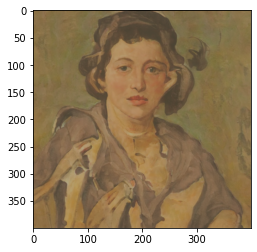

Total loss:  19.56990623474121
Content loss:  tensor(1.4219, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(18.1480, device='cuda:0', grad_fn=<MulBackward0>)


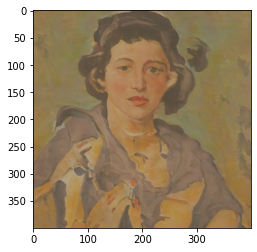

Total loss:  14.996137619018555
Content loss:  tensor(1.5442, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(13.4519, device='cuda:0', grad_fn=<MulBackward0>)


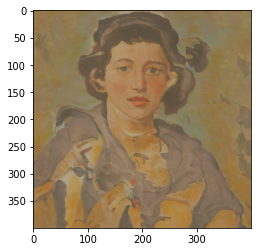

Total loss:  12.5447998046875
Content loss:  tensor(1.5908, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(10.9540, device='cuda:0', grad_fn=<MulBackward0>)


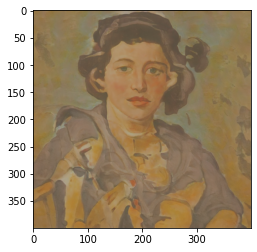

Total loss:  10.908625602722168
Content loss:  tensor(1.6166, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(9.2920, device='cuda:0', grad_fn=<MulBackward0>)


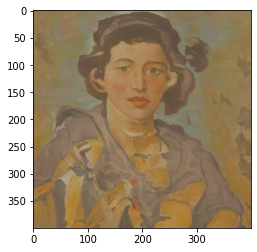

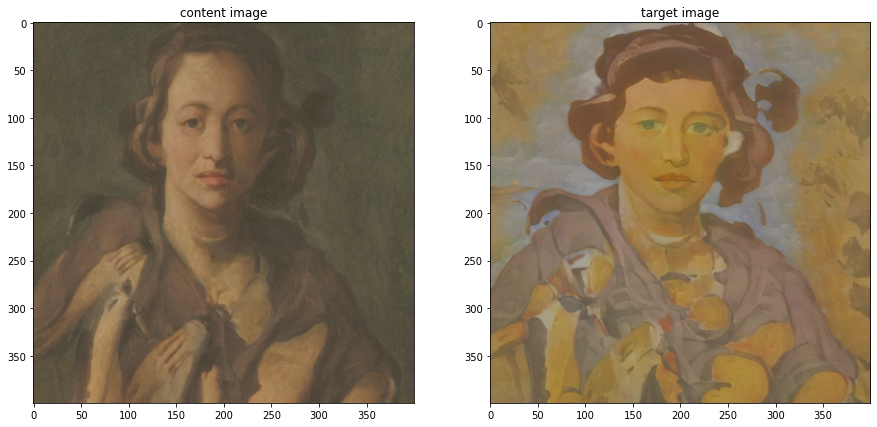

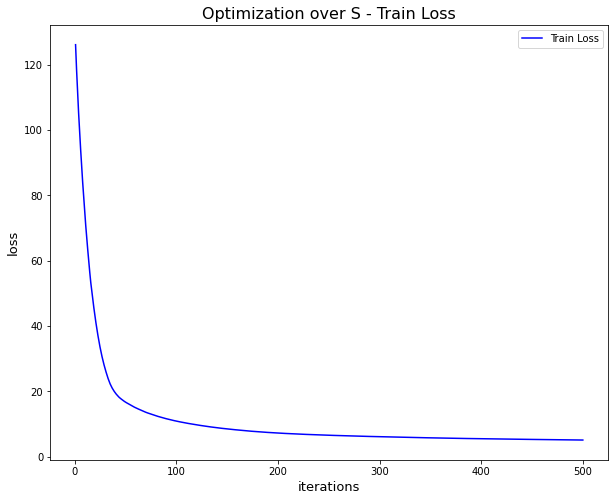

In [ ]:
run_optimizion_on_s(content_img1, style_img1, content_w1, CONTENT1_SEED)

start optimized
Total loss:  296.78533935546875
Content loss:  tensor(1.1955, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(295.5899, device='cuda:0', grad_fn=<MulBackward0>)


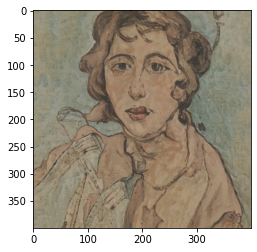

Total loss:  158.06707763671875
Content loss:  tensor(1.5998, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(156.4673, device='cuda:0', grad_fn=<MulBackward0>)


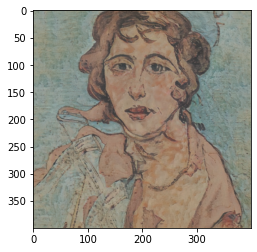

Total loss:  74.06953430175781
Content loss:  tensor(1.7984, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(72.2711, device='cuda:0', grad_fn=<MulBackward0>)


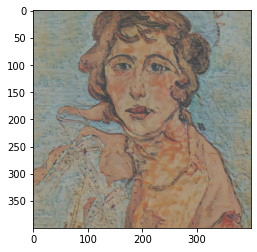

Total loss:  44.78532028198242
Content loss:  tensor(1.7465, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(43.0389, device='cuda:0', grad_fn=<MulBackward0>)


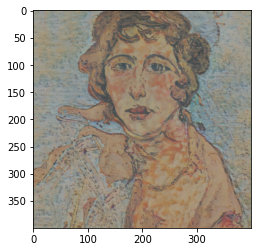

Total loss:  35.41800308227539
Content loss:  tensor(1.7214, device='cuda:0', grad_fn=<MulBackward0>)
Sytle loss:  tensor(33.6966, device='cuda:0', grad_fn=<MulBackward0>)


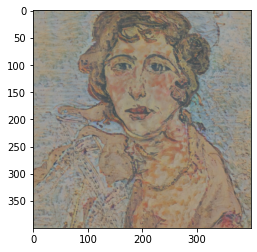

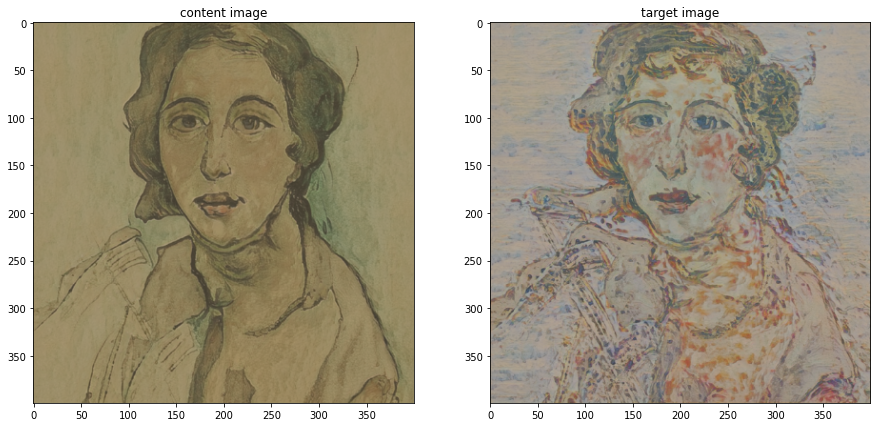

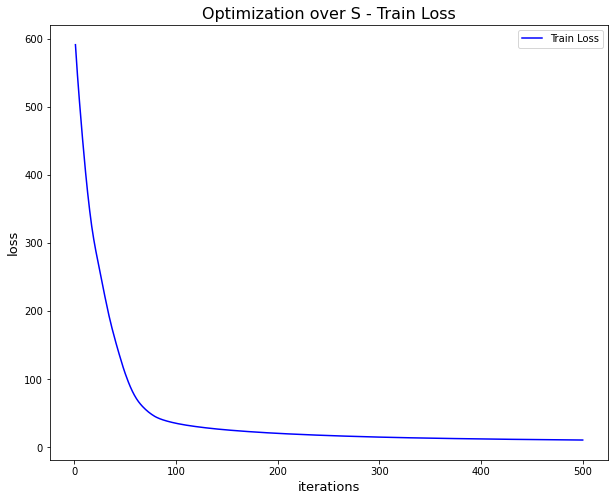

In [ ]:
run_optimizion_on_s(content_img2, style_img2, content_w2, CONTENT2_SEED)